## 2.预处理

In [1]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import numpy as np
from sklearn import metrics
import seaborn as sns
import matplotlib
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
plt.rcParams['figure.dpi'] = 150 
plt.rcParams.update({'font.size': 18})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica Neue']
import matplotlib.pyplot as plt


data = pd.read_excel('raw data/195-169.xlsx')  


In [2]:

data.isnull().sum()

ID                                         0
reaction times in incongruent stimuli      0
reaction times in congruent stimuli        0
reaction times in neutral stimuli          4
stroop interference effect                 4
accuracy in Go trials                      0
reaction times in Go trials                0
accuracy in Nogo trials                    0
Switching cost                             1
Mixinging cost                             1
accuracy in 1,750 ms                       8
accuracy in 750 ms                         1
span in digit span backward task           0
RPM                                        0
span in corsi block test                  22
accuracy in corsi block test              22
Age                                        0
Gender                                     0
Education years                            0
Ethnic                                     0
Residence                                  0
Only child                                 0
BMI       

In [3]:

for col in data.columns:
    data[col]=data[col].fillna(data[col].mean())

In [4]:
df =data

In [5]:
df['Inhibition Factor'] = 0.5 * df['stroop interference effect'] + 0.5 * df['accuracy in Nogo trials']
df['Executive Function Factor'] = df['Inhibition Factor'] / 3 + df['accuracy in 1,750 ms'] / 3 + df['Switching cost'] / 3
df['Inhibition and Updating Factor'] = 0.5 * df['Inhibition Factor'] + 0.5 * df['accuracy in 1,750 ms']
df['Inhibition and Switching Factor'] = 0.5 * df['Inhibition Factor'] + 0.5 * df['Switching cost']
df['Updating and Switching Factor'] = 0.5 * df['accuracy in 1,750 ms'] + 0.5 * df['Switching cost']

In [6]:
df

,ID,reaction times in incongruent stimuli,reaction times in congruent stimuli,reaction times in neutral stimuli,stroop interference effect,accuracy in Go trials,reaction times in Go trials,accuracy in Nogo trials,Switching cost,Mixinging cost,...,PANSS_Cognitive,PANSS Negative,PANSS Positive,PANSS General,follow-up,Inhibition Factor,Executive Function Factor,Inhibition and Updating Factor,Inhibition and Switching Factor,Updating and Switching Factor
0,0,741.96,629.303030,607.437500,21.865530,1.000000,404.230000,0.91,164.056328,107.386876,...,5.728553,11.000000,17.000000,30.000000,1.000000,11.387765,58.661920,5.964716,87.722046,82.298997
1,1,580.06,531.294118,560.117647,-28.823529,0.980000,351.285714,0.78,195.132222,189.329451,...,7.209558,11.000000,25.000000,29.000000,1.000000,-14.021765,60.703486,-6.510882,90.555229,98.066111
2,2,473.47,525.972222,537.727273,-11.755051,0.946667,435.636042,0.81,113.035294,-61.697879,...,8.529106,12.000000,16.000000,29.000000,0.000000,-5.472525,35.951479,-2.590429,53.781384,56.663480
3,3,618.25,652.294118,564.566667,87.727451,0.923333,461.407942,0.87,249.326376,-150.734961,...,7.862510,7.000000,17.000000,26.000000,1.000000,44.298725,98.069478,22.441029,146.812551,124.954855
4,4,664.84,585.909091,573.777778,12.131313,0.800000,462.920833,0.68,98.959132,-189.793660,...,11.239700,25.000000,24.000000,46.000000,0.000000,6.405657,35.302152,3.473662,52.682394,49.750399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,359,594.06,587.527778,595.323529,-7.795752,0.983333,394.572881,0.85,109.986111,92.599886,...,-1.000000,21.415385,22.005128,40.297436,0.441026,-3.472876,35.837745,-1.236438,53.256618,55.493056
360,360,577.73,562.406250,619.363636,-56.957386,1.000000,412.180000,0.88,224.891278,149.731269,...,-1.000000,21.415385,22.005128,40.297436,0.441026,-28.038693,65.909195,-13.581847,98.426292,112.883139
361,361,621.29,525.944444,563.666667,-37.722222,0.990000,398.390572,0.92,-7.164241,83.721812,...,-1.000000,21.415385,22.005128,40.297436,0.441026,-18.401111,-8.202340,-8.721389,-12.782676,-3.102954
362,362,539.00,514.588235,528.914286,-14.326050,0.990000,406.202020,0.88,351.921538,39.267899,...,-1.000000,21.415385,22.005128,40.297436,0.441026,-6.723025,115.399504,-2.861513,172.599257,176.460769


In [7]:
import pandas as pd

# Drop the 'ID' column
df = df.drop(columns=['ID'])

# Save the processed DataFrame
df.to_excel('./results/after preprocessing-classification.xlsx', sheet_name='Sheet1', index=True)

## 3.患者与对照组人口学、执行功能描述统计与差异检验

In [8]:
data = pd.read_excel('./results/after preprocessing-classification.xlsx')  

In [9]:
numeric_cols = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Age', 'Education years', 'BMI', 'SES','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']

categorical_cols = ['Gender', 'Ethnic', 'Residence', 'Only child', 'Smoking status', 'Alcohol consumption', 'Employed', 'Marital status']

In [10]:
import pandas as pd
from scipy.stats import ttest_ind
from numpy import std, mean, sqrt
import numpy as np


def cohens_d(group1, group2):
    """
    Compute Cohen's d.
    
    group1: Series or NumPy array
    group2: Series or NumPy array
    
    returns a float (Cohen's d)
    """
    diff = group1.mean() - group2.mean()

    n1, n2 = len(group1), len(group2)
    var1 = group1.var()
    var2 = group2.var()


    pooled_var = (n1 * var1 + n2 * var2) / (n1 + n2)
    

    d = diff / np.sqrt(pooled_var)
    
    return d


results_df = pd.DataFrame(columns=['Variable', 'SCZ Mean', 'SCZ Std Dev', 'HC Mean', 'HC Std Dev', 't', 'p', 'Cohen\'s d'])


for col in numeric_cols:
    scz = df[df['Group'] == 1][col]
    hc = df[df['Group'] == 2][col]
    
    t_stat, p_val = ttest_ind(scz, hc)
    
    d = cohens_d(scz, hc)
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    
    print(f'Variable {col}:\nSCZ group mean±std dev = {scz.mean():.2f} ± {scz.std():.2f}\nHC group mean±std dev = {hc.mean():.2f} ± {hc.std():.2f}\nt = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}\n')
    

    new_row = pd.DataFrame({
        'Variable': [col],
        'SCZ Mean': [scz.mean()],
        'SCZ Std Dev': [scz.std()],
        'HC Mean': [hc.mean()],
        'HC Std Dev': [hc.std()],
        't': [t_stat],
        'p': [p_val_str],
        'Cohen\'s d': [d]
    })

    results_df = pd.concat([results_df, new_row], ignore_index=True)


results_df.to_excel('./results/t-test-195-169.xlsx', index=False)

Variable reaction times in incongruent stimuli:
SCZ group mean±std dev = 751.79 ± 148.77
HC group mean±std dev = 663.61 ± 149.02
t = 5.636, p < 0.001, Cohen's d = 0.592

Variable reaction times in congruent stimuli:
SCZ group mean±std dev = 704.26 ± 132.24
HC group mean±std dev = 604.55 ± 118.40
t = 7.530, p < 0.001, Cohen's d = 0.791

Variable reaction times in neutral stimuli:
SCZ group mean±std dev = 725.71 ± 146.65
HC group mean±std dev = 610.97 ± 113.45
t = 8.253, p < 0.001, Cohen's d = 0.867

Variable stroop interference effect:
SCZ group mean±std dev = -23.01 ± 73.67
HC group mean±std dev = -7.09 ± 44.24
t = -2.452, p = 0.015, Cohen's d = -0.258

Variable accuracy in Go trials:
SCZ group mean±std dev = 0.83 ± 0.14
HC group mean±std dev = 0.94 ± 0.08
t = -8.963, p < 0.001, Cohen's d = -0.942

Variable reaction times in Go trials:
SCZ group mean±std dev = 486.47 ± 70.21
HC group mean±std dev = 426.96 ± 49.87
t = 9.190, p < 0.001, Cohen's d = 0.966

Variable accuracy in Nogo trials

In [11]:
from scipy.stats import chi2_contingency
import numpy as np


results = []


results_df = pd.DataFrame(columns=['Variable', 'SCZ Counts', 'SCZ Percentages', 'HC Counts', 'HC Percentages', 'Chi2', 'p', 'Cramer\'s V'])

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))



for col in categorical_cols:
    contingency_table = pd.crosstab(df['Group'], df[col])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    n1 = df[df['Group'] == 1][col].value_counts().sort_index().values
    n2 = df[df['Group'] == 2][col].value_counts().sort_index().values
    
    scz_counts = ', '.join(map(str, n1))
    scz_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n1/n1.sum())
    hc_counts = ', '.join(map(str, n2))
    hc_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n2/n2.sum())
    
    cramers_v_value = cramers_v(df['Group'], df[col])
    
    if p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p:.3f}"
        
        
        
        

    result = pd.DataFrame({
        'Variable': [col],
        'SCZ Counts': [scz_counts],
        'SCZ Percentages': [scz_percentages],
        'HC Counts': [hc_counts],
        'HC Percentages': [hc_percentages],
        'Chi2': [chi2],
        'p': [p_val_str],
        'Cramer\'s V': [cramers_v_value]
    })


    results.append(result)


results_df = pd.concat(results, ignore_index=True)


results_df.to_excel('./results/chi_square_test_results-195-169.xlsx', index=False)

## 4.诊断-患者组相关分析

### 1.执行功能与PANSS四维

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]


continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS General','reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']



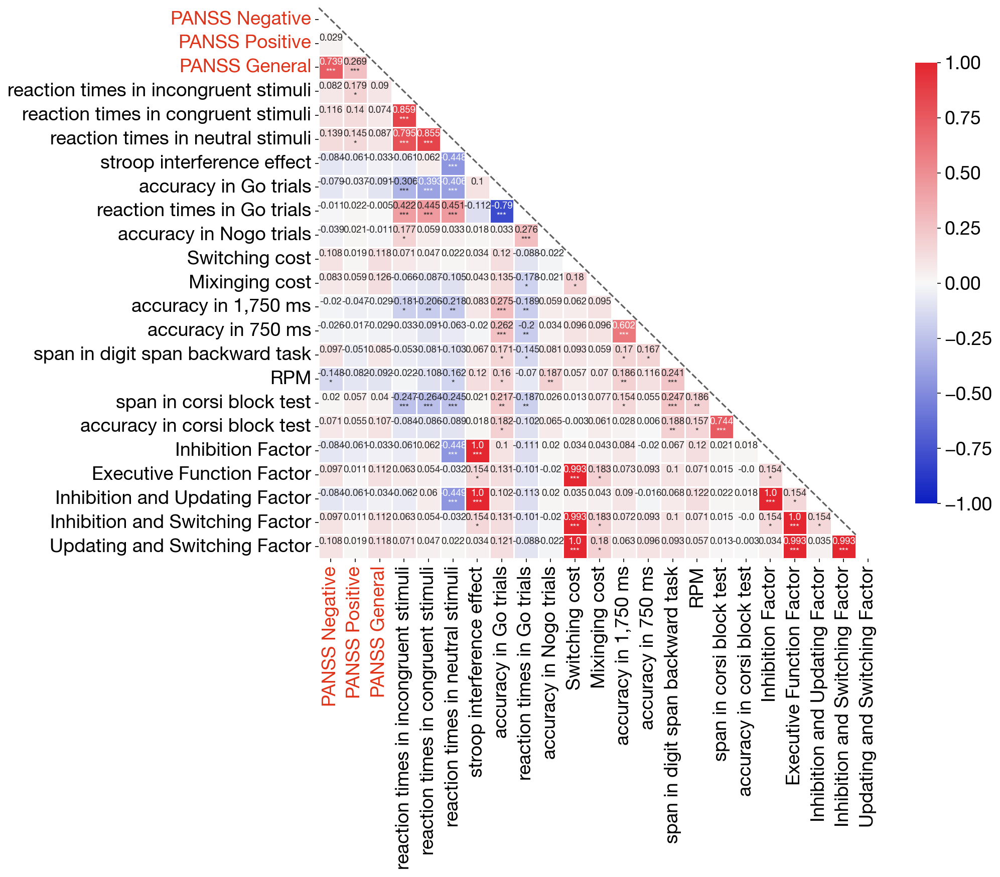

In [13]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.png", dpi=100, bbox_inches='tight')
plt.show()

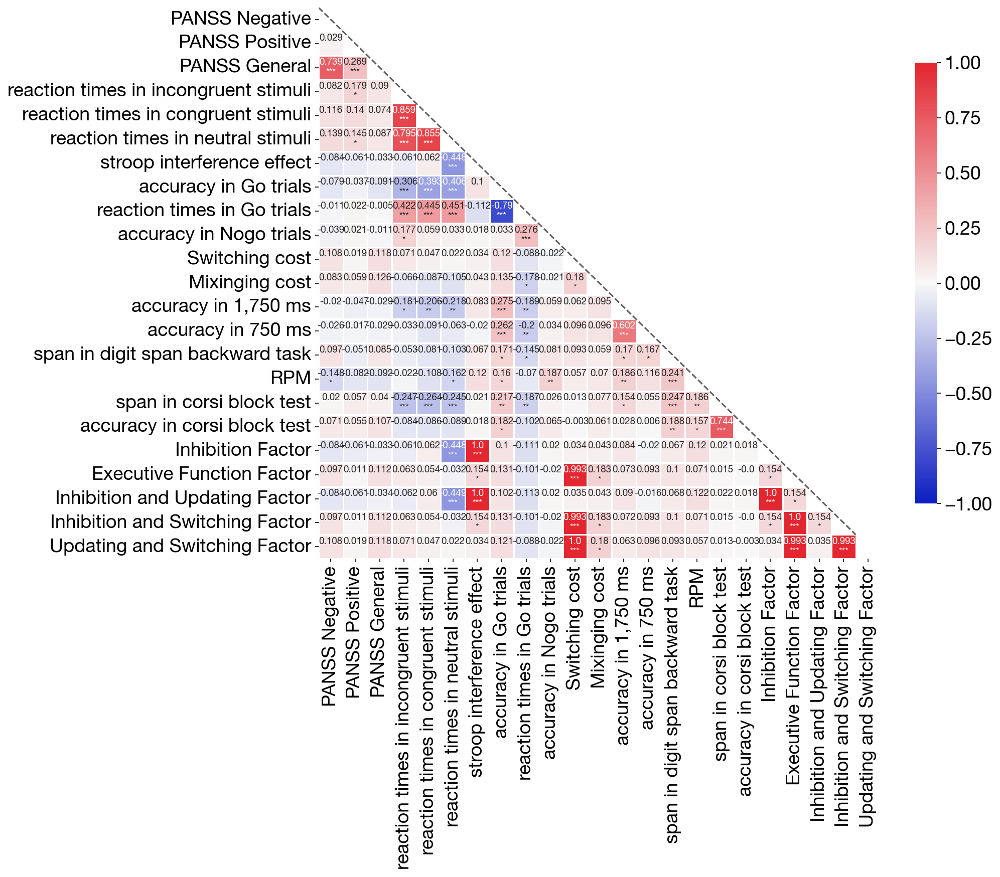

In [14]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS-N', 'PANSS-P', 'PANSS-G']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-执行功能与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

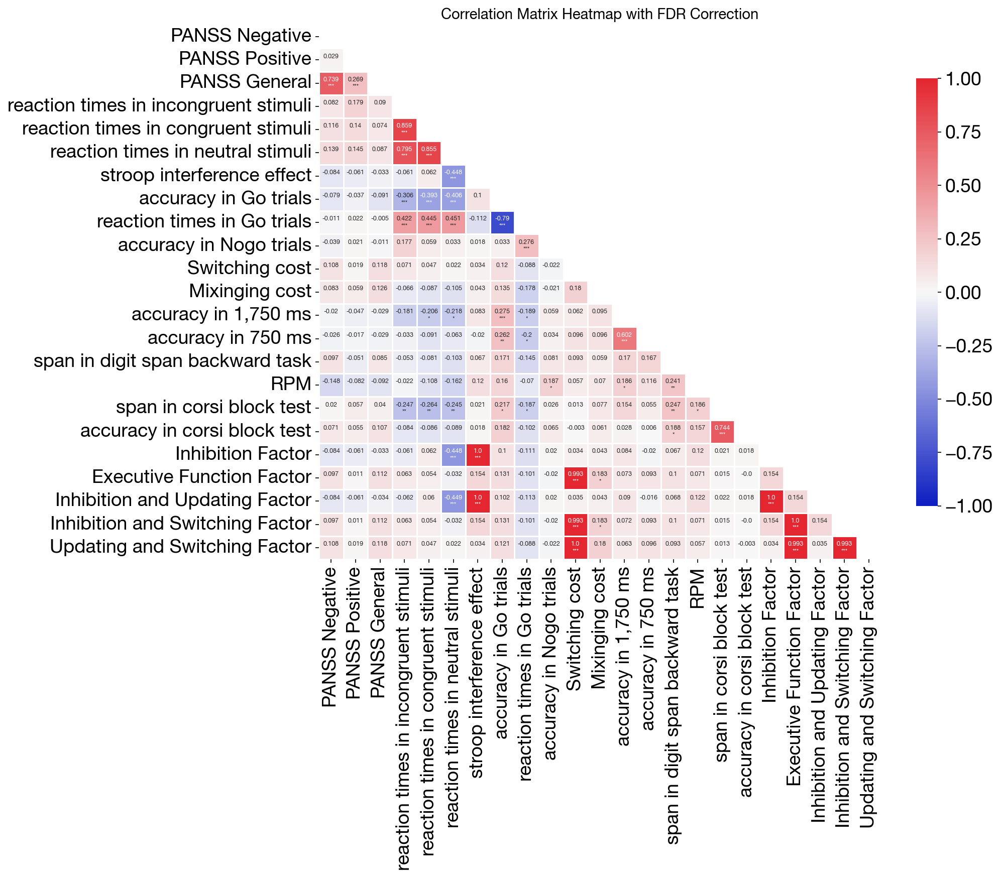

In [15]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-执行功能与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

# Assuming 'data' and 'pval_corr_matrix' are defined elsewhere in your code
# and contain the necessary data.

variables_of_interest = ['PANSS Negative', 'PANSS Positive', 'PANSS General']
significant_vars = []

# Find significant variables
for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

# Define how many plots per figure
plots_per_figure = 4 

# Calculate the total number of significant plots to be created
total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

# This counter will keep track of how many significant plots have been made
significant_plot_count = 0

# Loop through the variables and create each plot, saving figures as needed
for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        # Only plot if the p-value is significant
        if corrected_p < 0.05:
            # Check if we need to start a new figure
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    # Save the previous figure before starting a new one
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                # Start a new figure
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(24, 5))
                plt_idx = 0  # Reset plot index for the new figure
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(0.80, 1.05, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1  # Increment the plot index
            significant_plot_count += 1  # Increment the significant plot count

# Handle the last figure if it wasn't saved inside the loop
if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-社会人口与PANSS四维-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

### 2.社会人口与PANSS四维

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]


continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS General', 'RPM',
                      'Age', 'Education years', 'BMI', 'SES']

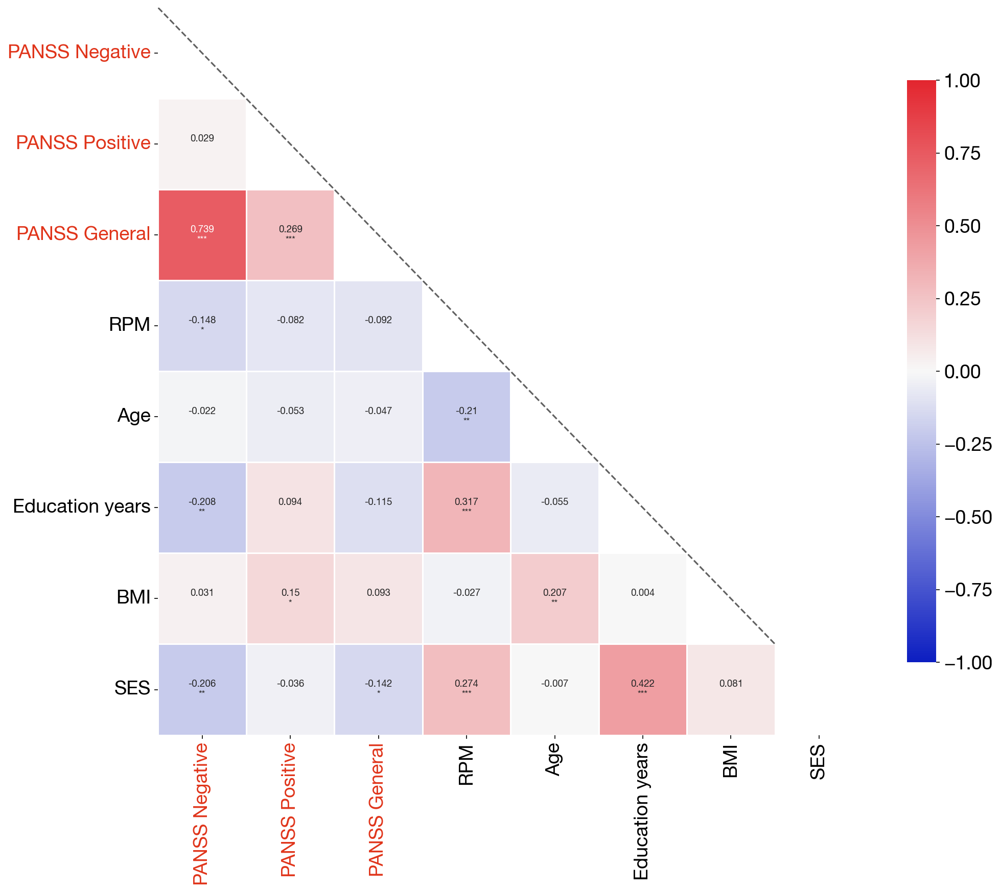

In [18]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

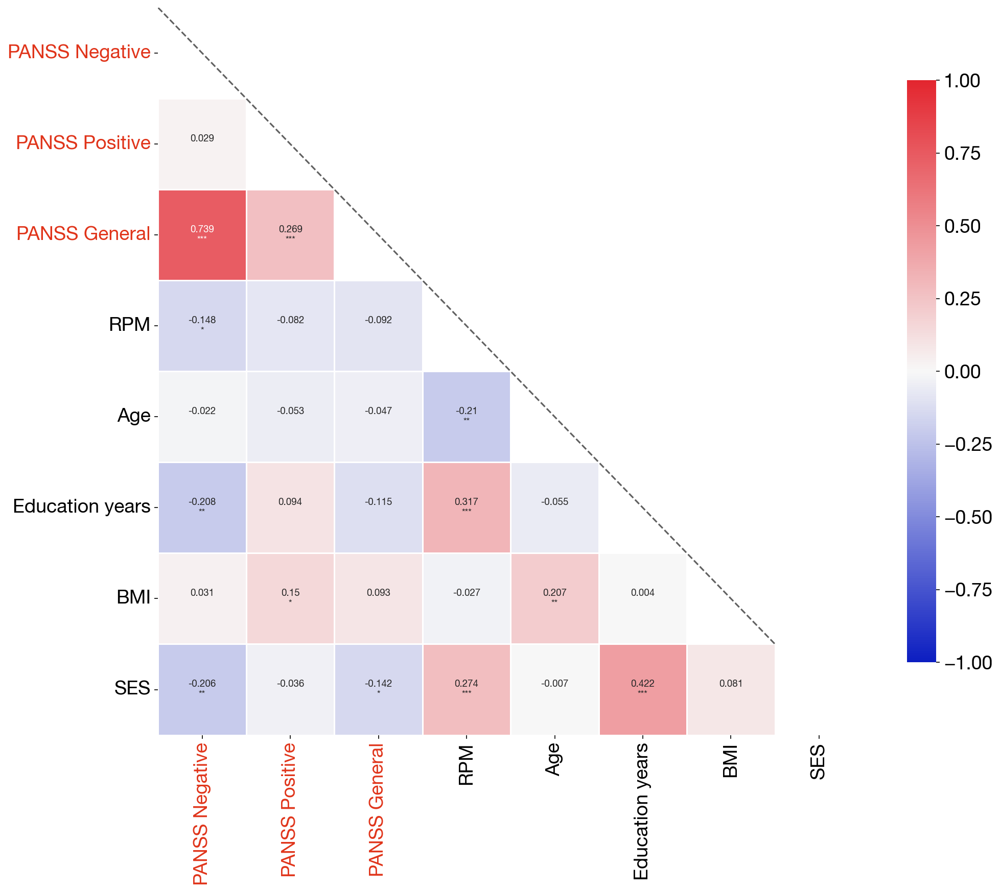

In [19]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

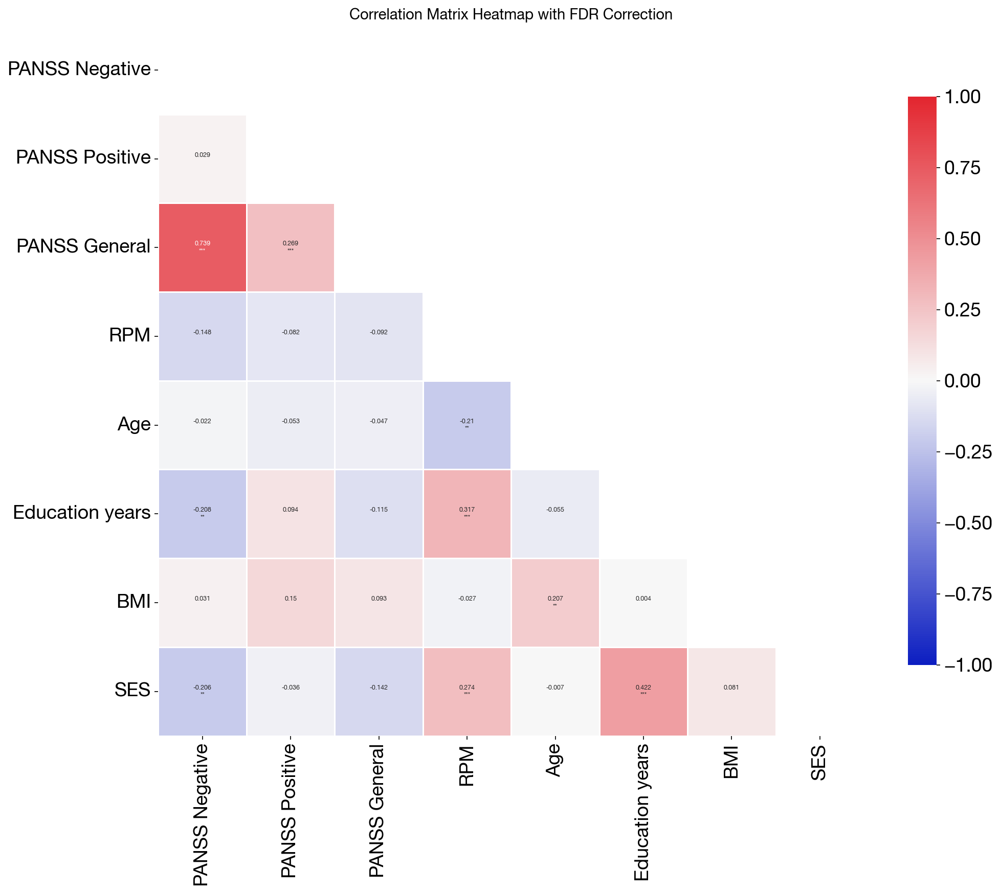

In [20]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

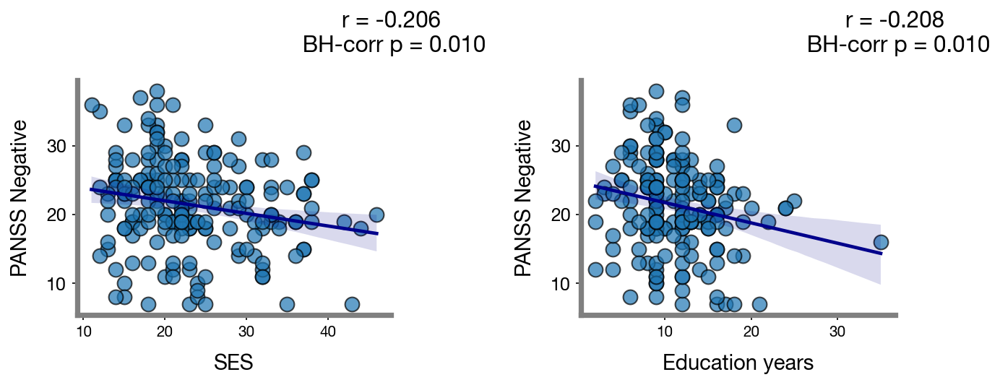

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  ['PANSS Negative', 'PANSS Positive', 'PANSS General']


significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 20

fig, axes = plt.subplots(num_rows, 4, figsize=(18, num_rows * 3))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 1.0
            ypos = 1.2

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/诊断-患者-社会人口与PANSS四维-fdr-散点图.jpg", dpi=600, bbox_inches='tight')
plt.show()

### 4.整个放在一起FDR

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency
df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]


continuous_columns = ['PANSS Negative', 'PANSS Positive', 'PANSS General','reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']



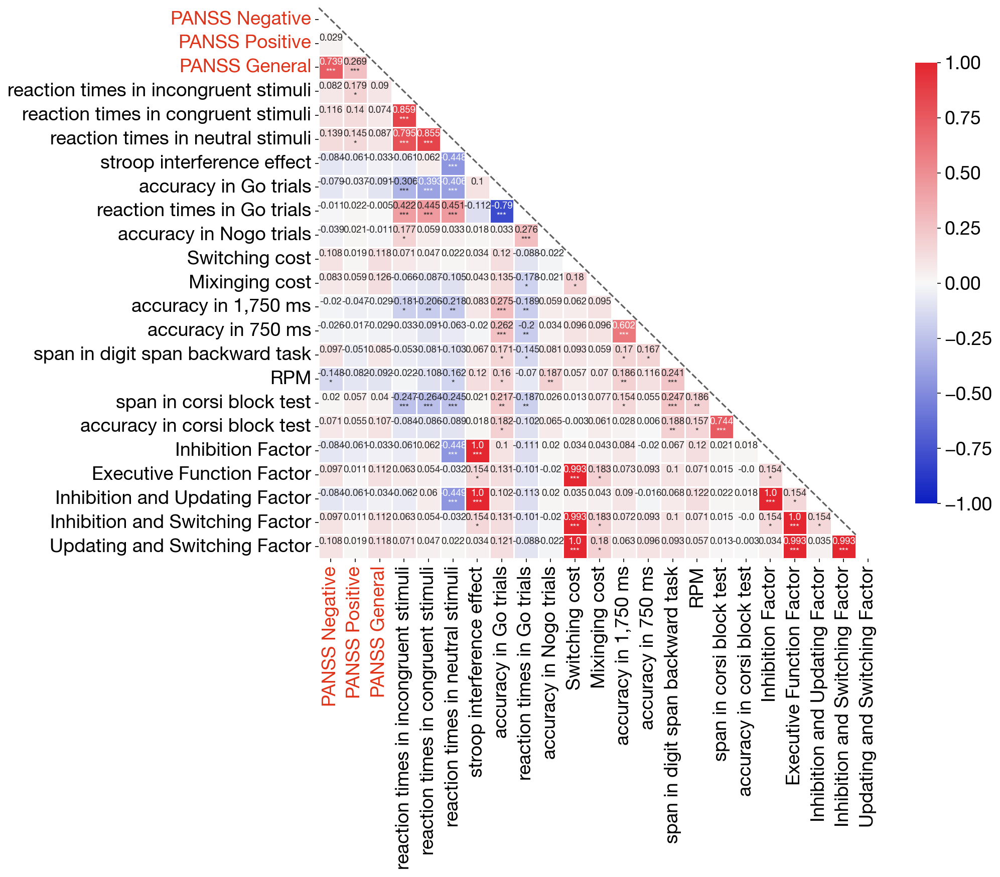

In [23]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

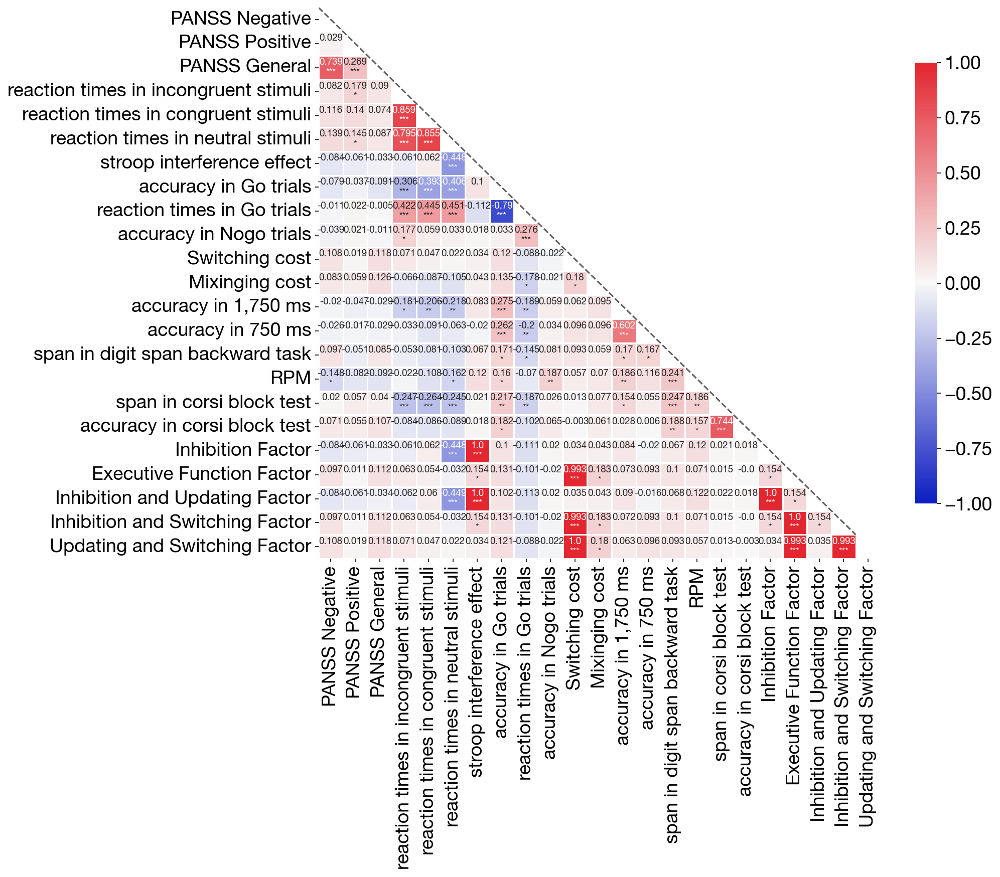

In [24]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df[df['Group'] == 1]
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()


def color_labels(labels):
    for label in labels:
        text = label.get_text()
        if text in ['PANSS-N', 'PANSS-P', 'PANSS-G']:
            label.set_color('#E0341A')
            
            
            
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

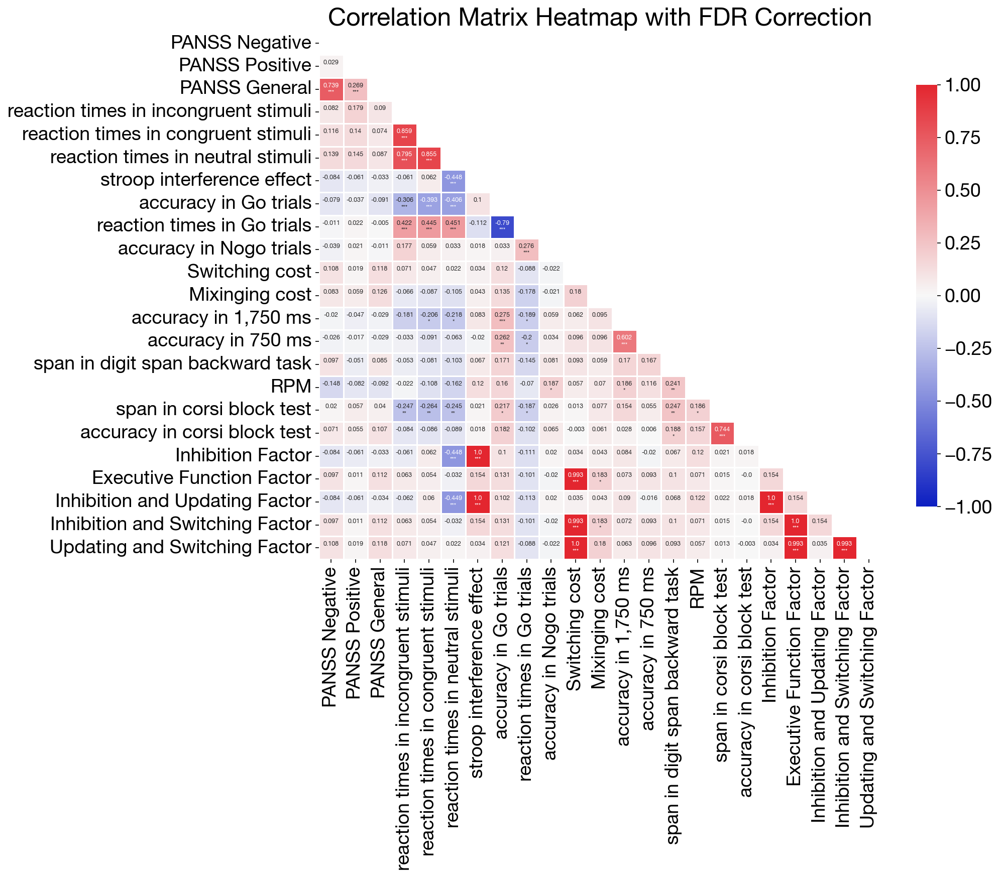

In [25]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=24, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/诊断-患者-整个FDR-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

#### 与社会人口

#### 与临床

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

# Assuming 'data' and 'pval_corr_matrix' are defined elsewhere in your code
# and contain the necessary data.


variables_of_interest =  ['PANSS Negative', 'PANSS Positive', 'PANSS General']
significant_vars = []

# Find significant variables
for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

# Define how many plots per figure
plots_per_figure = 4 

# Calculate the total number of significant plots to be created
total_plots = sum([len(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist()) for var in variables_of_interest])

# This counter will keep track of how many significant plots have been made
significant_plot_count = 0

# Loop through the variables and create each plot, saving figures as needed
for var2 in variables_of_interest:
    for var1 in significant_vars:
        corrected_p = pval_corr_matrix.loc[var1, var2]

        # Only plot if the p-value is significant
        if corrected_p < 0.05:
            # Check if we need to start a new figure
            if significant_plot_count % plots_per_figure == 0:
                if significant_plot_count > 0:
                    # Save the previous figure before starting a new one
                    plt.tight_layout()
                    plt.savefig(f"./results/诊断-患者-整个FDR-与临床-fdr-散点图-{(significant_plot_count // plots_per_figure)}.jpg", dpi=600, bbox_inches='tight')
                    plt.show()
                # Start a new figure
                fig, axes = plt.subplots(1, plots_per_figure, figsize=(24, 5))
                plt_idx = 0  # Reset plot index for the new figure
            
            ax = axes[plt_idx % plots_per_figure]
            paired_data = data[[var2, var1]].dropna()
            
            sns.regplot(
                x=paired_data[var1],
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'},
                line_kws={'color': 'darkblue'},
                ci=95,
                ax=ax
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2])
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"
            
            ax.text(0.80, 1.05, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(var1, fontsize=14, weight='bold', labelpad=10)
            
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)
            
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            
            plt_idx += 1  # Increment the plot index
            significant_plot_count += 1  # Increment the significant plot count

# Handle the last figure if it wasn't saved inside the loop
if significant_plot_count % plots_per_figure != 0:
    plt.tight_layout()
    plt.savefig(f"./results/诊断-患者-整个FDR-与临床-fdr-散点图-{(significant_plot_count // plots_per_figure) + 1}.jpg", dpi=600, bbox_inches='tight')
    plt.show()

### 补充1：患者执行功能与临床量表相关分析（不fdr）

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency


df = pd.read_excel('./results/after preprocessing-classification.xlsx')


data = df[df['Group'] == 1]

numeric_cols = ['reaction times in incongruent stimuli', 'reaction times in congruent stimuli', 'reaction times in neutral stimuli', 'stroop interference effect', 'accuracy in Go trials', 'reaction times in Go trials', 'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost', 'accuracy in 1,750 ms', 'accuracy in 750 ms', 'span in digit span backward task', 'RPM', 'span in corsi block test', 'accuracy in corsi block test', 'Age', 'Education years', 'BMI', 'SES','Inhibition Factor', 'Executive Function Factor', 'Inhibition and Updating Factor', 'Inhibition and Switching Factor', 'Updating and Switching Factor']

categorical_cols = ['Gender', 'Ethnic', 'Residence', 'Only child', 'Smoking status', 'Alcohol consumption', 'Employed', 'Marital status']

In [28]:
print(df.columns)


Index(['Unnamed: 0', 'reaction times in incongruent stimuli',
       'reaction times in congruent stimuli',
       'reaction times in neutral stimuli', 'stroop interference effect',
       'accuracy in Go trials', 'reaction times in Go trials',
       'accuracy in Nogo trials', 'Switching cost', 'Mixinging cost',
       'accuracy in 1,750 ms', 'accuracy in 750 ms',
       'span in digit span backward task', 'RPM', 'span in corsi block test',
       'accuracy in corsi block test', 'Age', 'Gender', 'Education years',
       'Ethnic', 'Residence', 'Only child', 'BMI', 'Smoking status',
       'Alcohol consumption', 'Employed', 'Marital status', 'SES', 'Group',
       'PANSS_Negative', 'PANSS_Positive', 'PANSS_Affective',
       'PANSS_Cognitive', 'PANSS Negative', 'PANSS Positive', 'PANSS General',
       'follow-up', 'Inhibition Factor', 'Executive Function Factor',
       'Inhibition and Updating Factor', 'Inhibition and Switching Factor',
       'Updating and Switching Factor'],
      

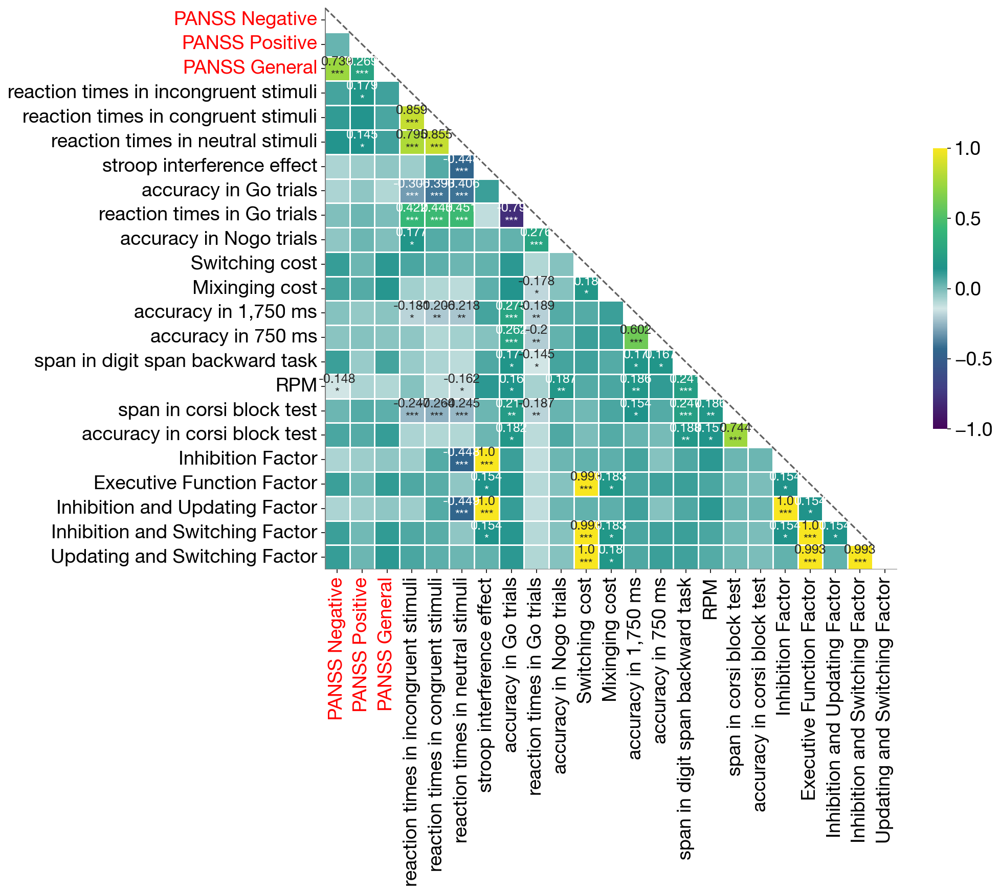

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr, chi2_contingency
import pandas as pd


rgb_colors = [
    (68, 4, 90),
    (65, 62, 133),
    (48, 104, 141),
    (210, 230, 230),  
    (31, 146, 139),
    (53, 183, 119),
    (145, 213, 66),
    (248, 230, 32)
]


hex_colors = ['#' + ''.join(['{:02x}'.format(val) for val in color]) for color in rgb_colors]


cmap = LinearSegmentedColormap.from_list("Custom", hex_colors, N=256)


corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels_corr = np.where((pvalues < 0.05), corr.round(3).astype(str), '')
labels_p = np.where((pvalues < 0.05), pvalues.applymap(significance_level), '')
labels = np.where((pvalues < 0.05), labels_corr + '\n' + labels_p, '')


mask = np.triu(np.ones_like(corr, dtype=bool))


np.fill_diagonal(corr.values, 0)
fig, ax = plt.subplots(figsize=(14, 12))


sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .5}, vmin=-1, vmax=1, annot_kws={"size": 12})

ax.axhline(y=len(corr), color='grey',linewidth=1.5)


ax.plot([0, 0], [0, len(corr)], color='grey', linewidth=1.5)

xticklabels = ax.get_xticklabels()
for label in xticklabels:
    text = label.get_text()
    if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_xticklabels(xticklabels)


yticklabels = ax.get_yticklabels()
for label in yticklabels:
    text = label.get_text()
    if text in ['PANSS Negative', 'PANSS Positive', 'PANSS General']:
        label.set_color('red')
        label.set_weight('bold')
ax.set_yticklabels(yticklabels)



plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/患者执行功能与社会人口学信息、临床量表相关分析-连续变量.png", dpi=100, bbox_inches='tight')
plt.show()



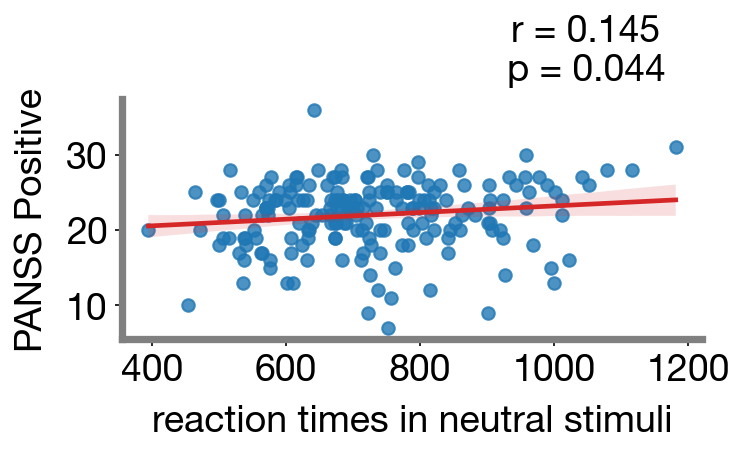

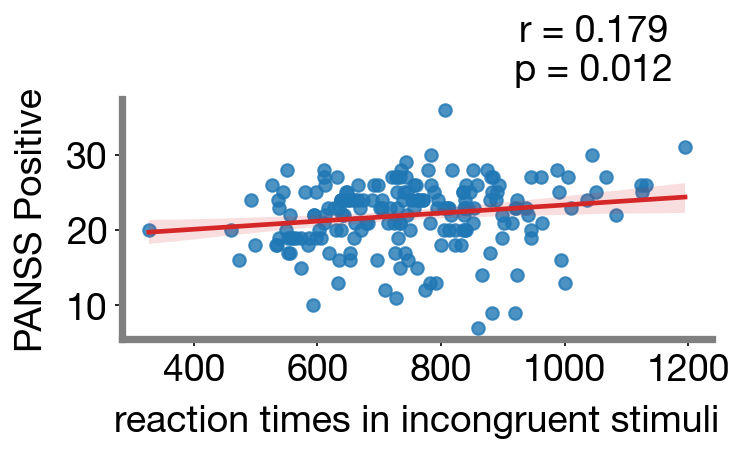

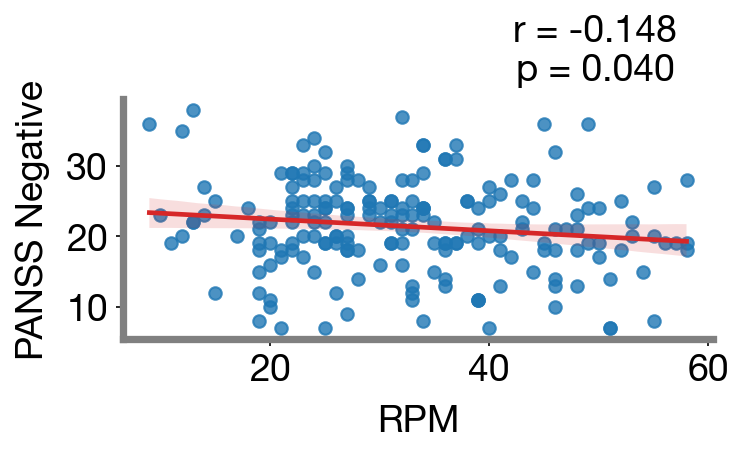

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

variables_of_interest = ['PANSS Negative', 'PANSS Positive', 'PANSS General']

significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var] < 0.05) & (pvalues.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

blue_hex = "#1f77b4"
red_hex = "#d62728"
grey_hex = "#808080"

for var1 in significant_vars:
    for var2 in variables_of_interest:
        if pvalues.loc[var1, var2] < 0.05:
            plt.figure(figsize=(5.3, 3.6))

            sns.regplot(x=data[var1], y=data[var2], line_kws={'color': red_hex}, scatter_kws={'color': blue_hex}, ci=95)

            r, p = pearsonr(data[var1], data[var2])
            xpos = 0.8
            ypos = 1.2
            plt.text(xpos, ypos, f'r = {r:.3f}\np = {p:.3f}', fontsize=18, weight='bold', ha='center', va='center', transform=plt.gca().transAxes)

            plt.xlabel(var1, fontsize=18, weight='bold', labelpad=8)
            plt.ylabel(var2, fontsize=18, weight='bold', labelpad=8)


            ax = plt.gca()
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color(grey_hex)
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color(grey_hex)


            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt.tight_layout()
            plt.savefig(f"./results/{var1}_vs-诊断患者EF-PANSS无FDR_{var2}.jpg", dpi=600, bbox_inches='tight')
            plt.show()

## 6.预后

### 预处理

In [31]:

data = pd.read_excel('./raw data/86.xlsx') 

In [32]:

data.isnull().sum()

reaction times in incongruent stimuli at baseline     0
reaction times in congruent stimuli at baseline       0
reaction times in neutral stimuli at baseline         2
stroop interference effect at baseline                0
accuracy in Go trials at baseline                     0
reaction times in Go trials at baseline               0
accuracy in Nogo trials at baseline                   0
Switching cost at baseline                            0
Mixinging cost at baseline                            0
accuracy in 1,750 ms at baseline                      0
accuracy in 750 ms at baseline                        0
span in digit span backward task at baseline          0
span in corsi block test at baseline                  9
accuracy in corsi block test at baseline              9
reaction times in incongruent stimuli at follow-up    0
reaction times in congruent stimuli at follow-up      0
reaction times in neutral stimuli at follow-up        0
stroop interference effect at follow-up         

In [33]:

for col in data.columns:
    data[col]=data[col].fillna(data[col].mean())

In [34]:
df =data

In [35]:
df['Inhibition Factor at baseline'] = 0.5 * df['stroop interference effect at baseline'] + 0.5 * df['accuracy in Nogo trials at baseline']
df['Executive Function Factor at baseline'] = df['Inhibition Factor at baseline'] / 3 + df['accuracy in 1,750 ms at baseline'] / 3 + df['Switching cost at baseline'] / 3
df['Inhibition and Updating Factor at baseline'] = 0.5 * df['Inhibition Factor at baseline'] + 0.5 * df['accuracy in 1,750 ms at baseline']
df['Inhibition and Switching Factor at baseline'] = 0.5 * df['Inhibition Factor at baseline'] + 0.5 * df['Switching cost at baseline']
df['Updating and Switching Factor at baseline'] = 0.5 * df['accuracy in 1,750 ms at baseline'] + 0.5 * df['Switching cost at baseline']

In [36]:
df['Inhibition Factor at follow-up'] = 0.5 * df['stroop interference effect at follow-up'] + 0.5 * df['accuracy in Nogo trials at follow-up']
df['Executive Function Factor at follow-up'] = df['Inhibition Factor at follow-up'] / 3 + df['accuracy in 1,750 ms at baseline'] / 3 + df['Switching cost at follow-up'] / 3
df['Inhibition and Updating Factor at follow-up'] = 0.5 * df['Inhibition Factor at follow-up'] + 0.5 * df['accuracy in 1,750 ms at follow-up']
df['Inhibition and Switching Factor at follow-up'] = 0.5 * df['Inhibition Factor at follow-up'] + 0.5 * df['Switching cost at follow-up']
df['Updating and Switching Factor at follow-up'] = 0.5 * df['accuracy in 1,750 ms at follow-up'] + 0.5 * df['Switching cost at follow-up']

In [37]:

# 保存到 Excel 文件
df.to_excel('./results/after preprocessing-prognosis.xlsx', sheet_name='Sheet1', index=True)

### 差异检验

In [38]:
data = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

#### 整体差异检验

In [39]:
import numpy as np
from scipy import stats


def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)


paired_cols = [
('reaction times in incongruent stimuli at baseline', 'reaction times in incongruent stimuli at follow-up'),
('reaction times in congruent stimuli at baseline', 'reaction times in congruent stimuli at follow-up'),
('reaction times in neutral stimuli at baseline', 'reaction times in neutral stimuli at follow-up'),
('stroop interference effect at baseline', 'stroop interference effect at follow-up'),
('accuracy in Go trials at baseline', 'accuracy in Go trials at follow-up'),
('reaction times in Go trials at baseline', 'reaction times in Go trials at follow-up'),
('accuracy in Nogo trials at baseline', 'accuracy in Nogo trials at follow-up'),
('Switching cost at baseline', 'Switching cost at follow-up'),
('Mixinging cost at baseline', 'Mixinging cost at follow-up'),
('accuracy in 1,750 ms at baseline', 'accuracy in 1,750 ms at follow-up'),
('accuracy in 750 ms at baseline', 'accuracy in 750 ms at follow-up'),
('span in digit span backward task at baseline', 'span in digit span backward task at follow-up'),
('span in corsi block test at baseline', 'span in corsi block test at follow-up'),
('accuracy in corsi block test at baseline', 'accuracy in corsi block test at follow-up'),
('PANNS negative at baseline', 'PANNS negative at follow-up'),
('PANNS positive at baseline', 'PANNS positive at follow-up'),
('PANNS general at baseline', 'PANNS general at follow-up'),
]


for col1, col2 in paired_cols:
    pre_treatment = df[col1]
    post_treatment = df[col2]
    t_stat, p_val = stats.ttest_rel(pre_treatment, post_treatment)
    d = cohens_d(pre_treatment, post_treatment)
    if p_val < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p_val:.3f}"
    print(f'变量 {col1} vs {col2}:\n治疗前平均值±标准差 = {pre_treatment.mean():.2f} ± {pre_treatment.std():.2f}\n治疗后平均值±标准差 = {post_treatment.mean():.2f} ± {post_treatment.std():.2f}\nt = {t_stat:.3f}, {p_val_str}, Cohen\'s d = {d:.3f}\n')

变量 reaction times in incongruent stimuli at baseline vs reaction times in incongruent stimuli at follow-up:
治疗前平均值±标准差 = 764.28 ± 152.17
治疗后平均值±标准差 = 721.14 ± 140.05
t = 2.763, p = 0.007, Cohen's d = 0.295

变量 reaction times in congruent stimuli at baseline vs reaction times in congruent stimuli at follow-up:
治疗前平均值±标准差 = 723.00 ± 133.13
治疗后平均值±标准差 = 677.56 ± 121.80
t = 3.264, p = 0.002, Cohen's d = 0.356

变量 reaction times in neutral stimuli at baseline vs reaction times in neutral stimuli at follow-up:
治疗前平均值±标准差 = 736.94 ± 148.03
治疗后平均值±标准差 = 686.10 ± 124.85
t = 3.421, p < 0.001, Cohen's d = 0.371

变量 stroop interference effect at baseline vs stroop interference effect at follow-up:
治疗前平均值±标准差 = 3.20 ± 145.73
治疗后平均值±标准差 = -8.53 ± 63.52
t = 0.702, p = 0.484, Cohen's d = 0.104

变量 accuracy in Go trials at baseline vs accuracy in Go trials at follow-up:
治疗前平均值±标准差 = 0.82 ± 0.15
治疗后平均值±标准差 = 0.82 ± 0.15
t = 0.041, p = 0.968, Cohen's d = 0.005

变量 reaction times in Go trials at baseline 

#### 分组差异检验

In [40]:
data = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

In [41]:
numeric_cols = [
'reaction times in incongruent stimuli at baseline',
'reaction times in congruent stimuli at baseline',
'reaction times in neutral stimuli at baseline',
'stroop interference effect at baseline',
'accuracy in Go trials at baseline',
'reaction times in Go trials at baseline',
'accuracy in Nogo trials at baseline',
'Switching cost at baseline',
'Mixinging cost at baseline',
'accuracy in 1,750 ms at baseline',
'accuracy in 750 ms at baseline',
'span in digit span backward task at baseline',
'span in corsi block test at baseline',
'accuracy in corsi block test at baseline',
'Inhibition Factor at baseline',
'Executive Function Factor at baseline',
'Inhibition and Updating Factor at baseline',
'Inhibition and Switching Factor at baseline',
'Updating and Switching Factor at baseline',
'reaction times in incongruent stimuli at follow-up',
'reaction times in congruent stimuli at follow-up',
'reaction times in neutral stimuli at follow-up',
'stroop interference effect at follow-up',
'accuracy in Go trials at follow-up',
'reaction times in Go trials at follow-up',
'accuracy in Nogo trials at follow-up',
'Switching cost at follow-up',
'Mixinging cost at follow-up',
'accuracy in 1,750 ms at follow-up',
'accuracy in 750 ms at follow-up',
'span in digit span backward task at follow-up',
'span in corsi block test at follow-up',
'accuracy in corsi block test at follow-up',
'Inhibition Factor at follow-up',
'Executive Function Factor at follow-up',
'Inhibition and Updating Factor at follow-up',
'Inhibition and Switching Factor at follow-up',
'Updating and Switching Factor at follow-up',
'RPM',
'Age',
'Education years',
'BMI',
'SES',
'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS general at baseline',
'Frequency of episodes',
'Age of onset',
'Illness of duration (years)',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up'
]

categorical_cols = [
    'First episode',
    'Gender',
    'Ethnic',
    'Residence',
    'Only child',
    'Smoking status',
    'Alcohol consumption',
    'Employed',
    'Marital status',
    'Family history of psychiatric disorders',
    'Previous medical history'
]

In [42]:
df = data

In [43]:
print(df.columns)

Index(['Unnamed: 0', 'reaction times in incongruent stimuli at baseline',
       'reaction times in congruent stimuli at baseline',
       'reaction times in neutral stimuli at baseline',
       'stroop interference effect at baseline',
       'accuracy in Go trials at baseline',
       'reaction times in Go trials at baseline',
       'accuracy in Nogo trials at baseline', 'Switching cost at baseline',
       'Mixinging cost at baseline', 'accuracy in 1,750 ms at baseline',
       'accuracy in 750 ms at baseline',
       'span in digit span backward task at baseline',
       'span in corsi block test at baseline',
       'accuracy in corsi block test at baseline',
       'reaction times in incongruent stimuli at follow-up',
       'reaction times in congruent stimuli at follow-up',
       'reaction times in neutral stimuli at follow-up',
       'stroop interference effect at follow-up',
       'accuracy in Go trials at follow-up',
       'reaction times in Go trials at follow-up',
   

In [44]:
import pandas as pd
from scipy.stats import ttest_ind
from numpy import std, mean, sqrt




def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (mean(x) - mean(y)) / sqrt(((nx-1)*std(x, ddof=1) ** 2 + (ny-1)*std(y, ddof=1) ** 2) / dof)


results_df = pd.DataFrame(columns=['Variable', 'Remission_Mean', 'Remission_SD', 'NoRemission_Mean', 'NoRemission_SD', 't_stat', 'p_value', 'Cohen_d'])


for col in numeric_cols:
    remission = df[df['Group'] == 1][col]
    no_remission = df[df['Group'] == 2][col]
    t_stat, p_val = ttest_ind(remission, no_remission)
    d = cohens_d(remission, no_remission)
    if p_val < 0.001:
        p_val_str = "< 0.001"
    else:
        p_val_str = f"{p_val:.3f}"
        

        results_df = pd.concat([results_df, pd.DataFrame({
            'Variable': [col],
            'Remission_Mean': [remission.mean()],
            'Remission_SD': [remission.std()],
            'NoRemission_Mean': [no_remission.mean()],
            'NoRemission_SD': [no_remission.std()],
            't_stat': [t_stat],
            'p_value': [p_val_str],
            'Cohen_d': [d]
        })], ignore_index=True)
        
        



results_df.to_excel('./results/t_test_results-86.xlsx', index=False)

In [45]:
import pandas as pd
from scipy.stats import chi2_contingency
import numpy as np


results = []


results_df = pd.DataFrame(columns=['Variable', 'remission Counts', 'remission Percentages', 'no-remission Counts', 'no-remission Percentages', 'Chi2', 'p', 'Cramer\'s V'])

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))



for col in categorical_cols:
    contingency_table = pd.crosstab(df['Group'], df[col])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    n1 = df[df['Group'] == 1][col].value_counts().sort_index().values
    n2 = df[df['Group'] == 2][col].value_counts().sort_index().values
    
    remission_counts = ', '.join(map(str, n1))
    remission_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n1/n1.sum())
    noremission_counts = ', '.join(map(str, n2))
    noremission_percentages = ', '.join(f'{perc*100:.1f}%' for perc in n2/n2.sum())
    
    cramers_v_value = cramers_v(df['Group'], df[col])
    
    if p < 0.001:
        p_val_str = "p < 0.001"
    else:
        p_val_str = f"p = {p:.3f}"
        

    result = pd.DataFrame({
        'Variable': [col],
        'remission Counts': [remission_counts],
        'remission Percentages': [remission_percentages],
        'no-remission Counts': [noremission_counts],
        'no-remission Percentages': [noremission_percentages],
        'Chi2': [chi2],
        'p': [p_val_str],
        'Cramer\'s V': [cramers_v_value]
    })


    results.append(result)


results_df = pd.concat(results, ignore_index=True)


results_df.to_excel('./results/chi_square_test_results-86.xlsx', index=False)

### 86人相关分析

#### 1.分开FDR

##### 1.执行功能与PANSS四维

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')


continuous_columns = ['reaction times in incongruent stimuli at baseline',
'reaction times in congruent stimuli at baseline',
'reaction times in neutral stimuli at baseline',
'stroop interference effect at baseline',
'accuracy in Go trials at baseline',
'reaction times in Go trials at baseline',
'accuracy in Nogo trials at baseline',
'Switching cost at baseline',
'Mixinging cost at baseline',
'accuracy in 1,750 ms at baseline',
'accuracy in 750 ms at baseline',
'span in digit span backward task at baseline',
'span in corsi block test at baseline',
'accuracy in corsi block test at baseline',
'Inhibition Factor at baseline',
'Executive Function Factor at baseline',
'Inhibition and Updating Factor at baseline',
'Inhibition and Switching Factor at baseline',
'Updating and Switching Factor at baseline',
'Illness of duration (years)',
'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up',
'Change in negative factor',
'Change in positive factor',
'Change in general']



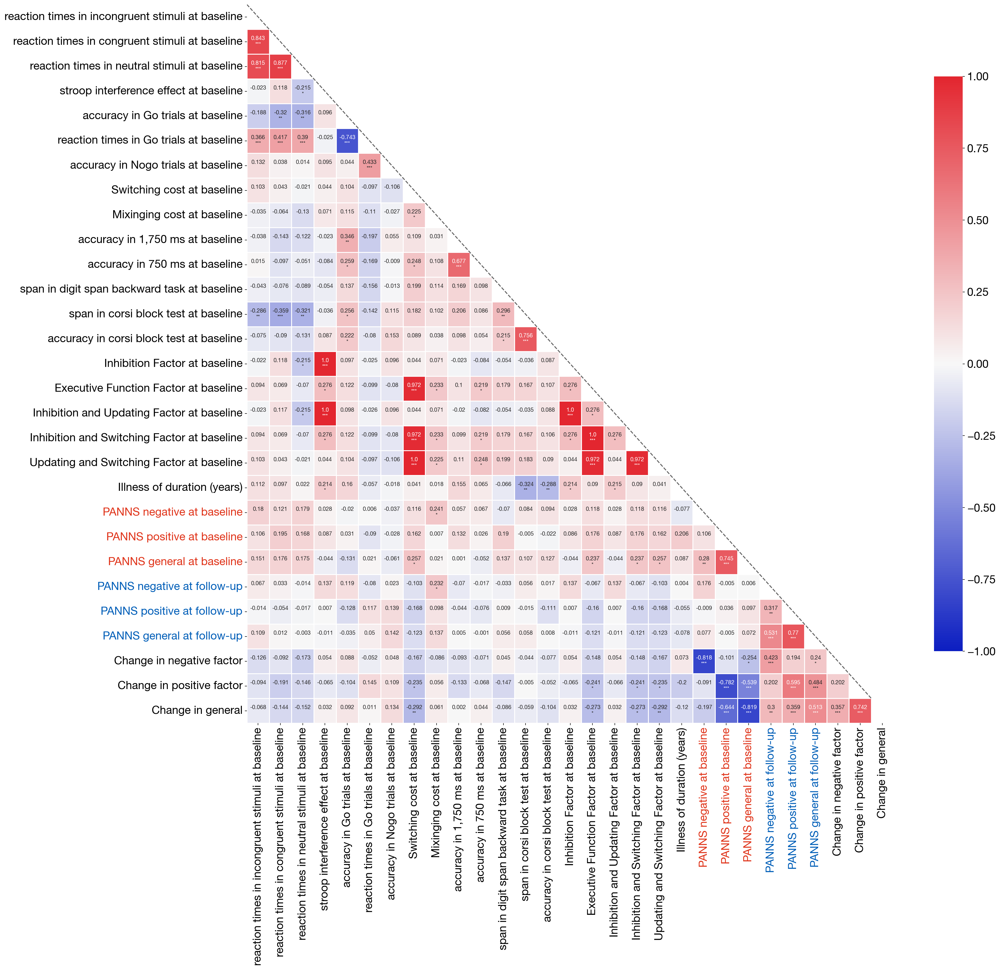

In [47]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(24, 22))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in ['PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS general at baseline',]:
            label.set_color('#E0341A') 
        elif text in ['PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up']:
            label.set_color('#005EB8') 
        elif text in ['Change in negative factor (baseline minus follow-up)',
'Change in positive factor (baseline minus follow-up)',
'Change in general (baseline minus follow-up)']:
            label.set_color('#F67737')  

color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维.jpg", dpi=100, bbox_inches='tight')
plt.show()

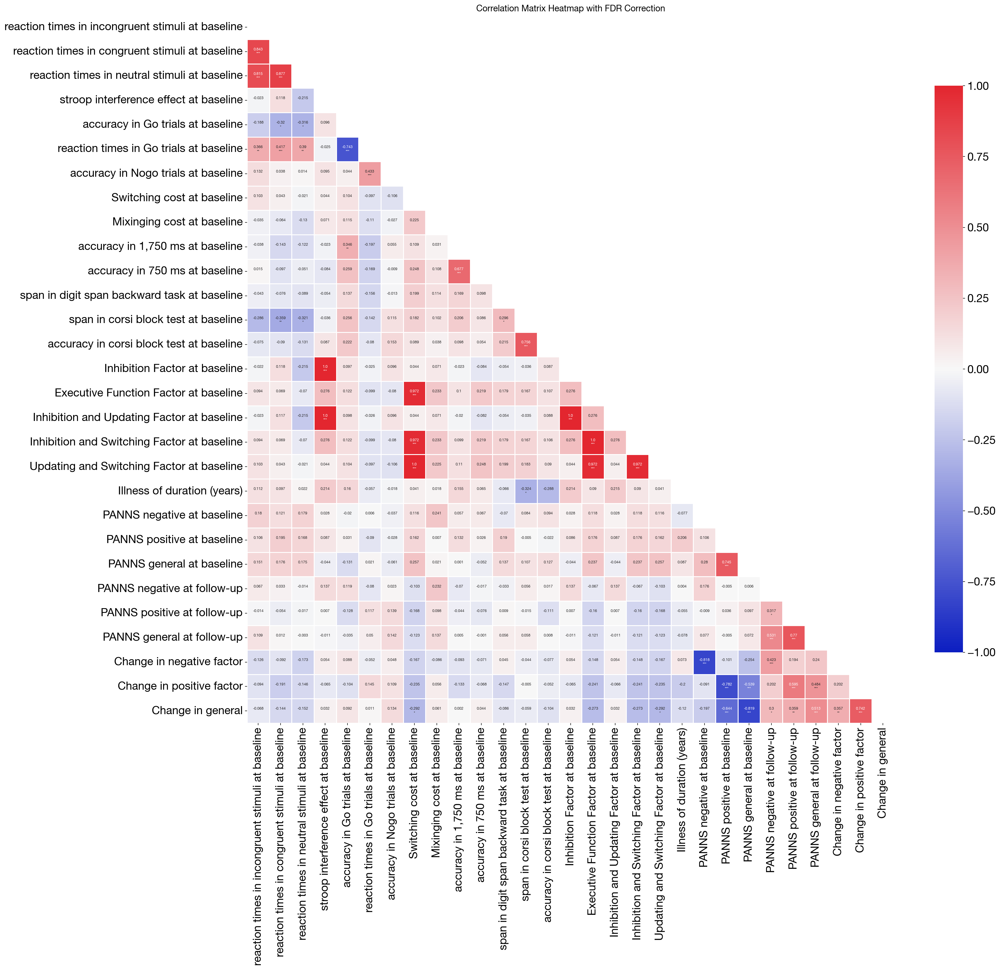

In [48]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(24, 22))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维-fdr.jpg", dpi=100, bbox_inches='tight')
plt.show()

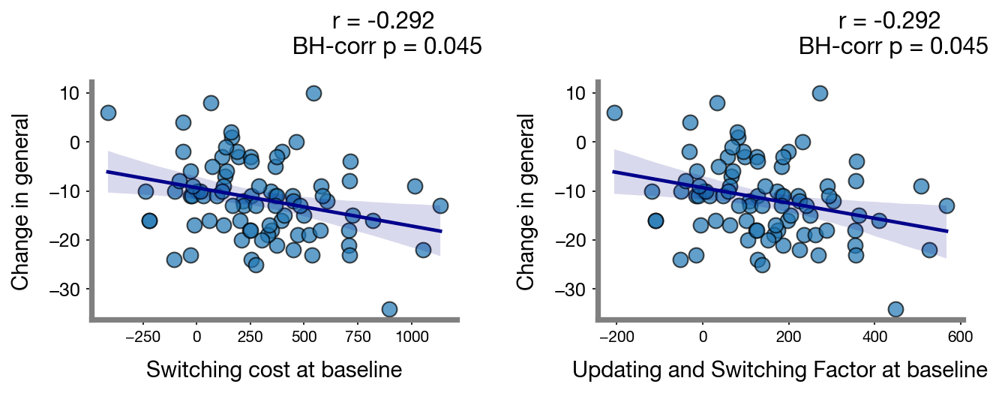

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  [
    'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up',
'Change in negative factor',
'Change in positive factor',
'Change in general']


significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 5  

fig, axes = plt.subplots(num_rows, 4, figsize=(18, num_rows * 3))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 0.8
            ypos = 1.2

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/预后-分开fdr-执行功能与PANSS四维-fdr-散点图.jpg", dpi=600, bbox_inches='tight')
plt.show()

#### 2.整个FDR

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency

df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')

continuous_columns =['reaction times in incongruent stimuli at baseline',
'reaction times in congruent stimuli at baseline',
'reaction times in neutral stimuli at baseline',
'stroop interference effect at baseline',
'accuracy in Go trials at baseline',
'reaction times in Go trials at baseline',
'accuracy in Nogo trials at baseline',
'Switching cost at baseline',
'Mixinging cost at baseline',
'accuracy in 1,750 ms at baseline',
'accuracy in 750 ms at baseline',
'span in digit span backward task at baseline',
'span in corsi block test at baseline',
'accuracy in corsi block test at baseline',
'Inhibition Factor at baseline',
'Executive Function Factor at baseline',
'Inhibition and Updating Factor at baseline',
'Inhibition and Switching Factor at baseline',
'Updating and Switching Factor at baseline',
'Illness of duration (years)',
'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up',
'Change in negative factor',
'Change in positive factor',
'Change in general']


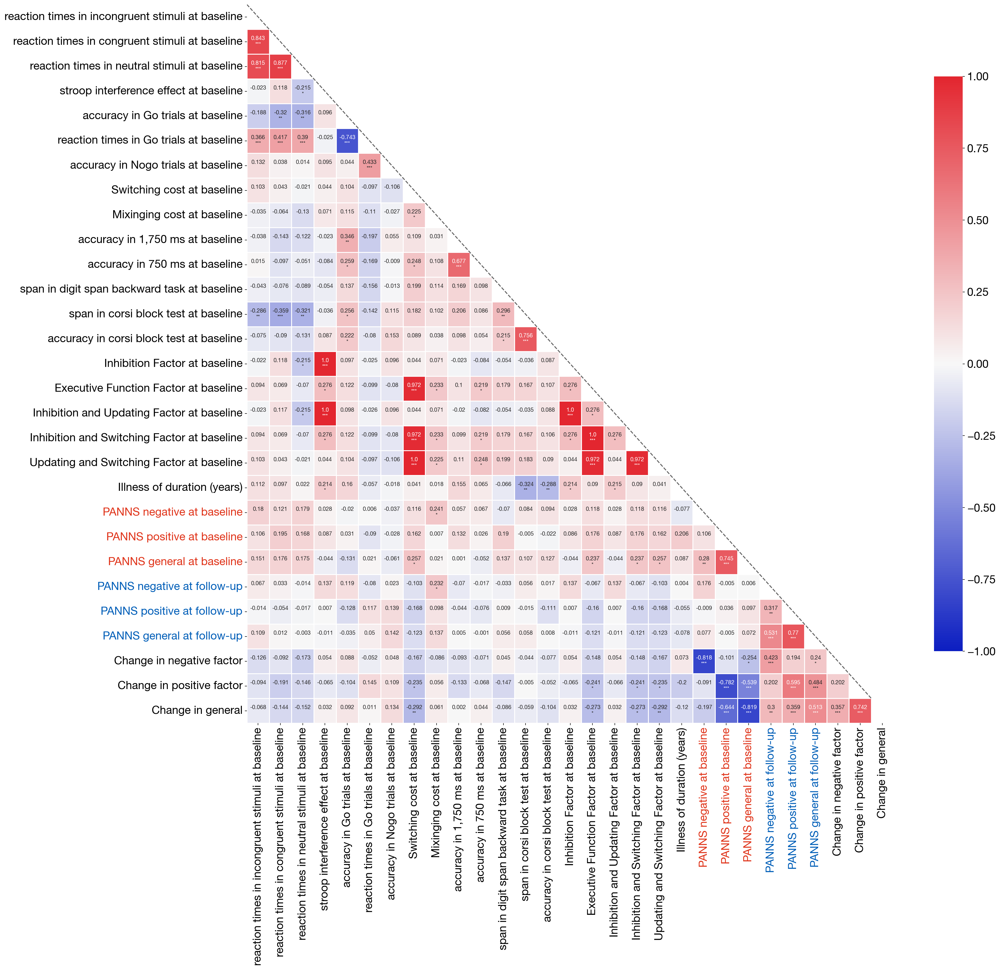

In [51]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(24, 22))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in ['PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS general at baseline',]:
            label.set_color('#E0341A') 
        elif text in ['PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up']:
            label.set_color('#005EB8') 
        elif text in ['Change in negative factor (baseline minus follow-up)',
'Change in positive factor (baseline minus follow-up)',
'Change in general (baseline minus follow-up)']:
            label.set_color('#F67737')  

color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.jpg", dpi=100, bbox_inches='tight')
plt.show()

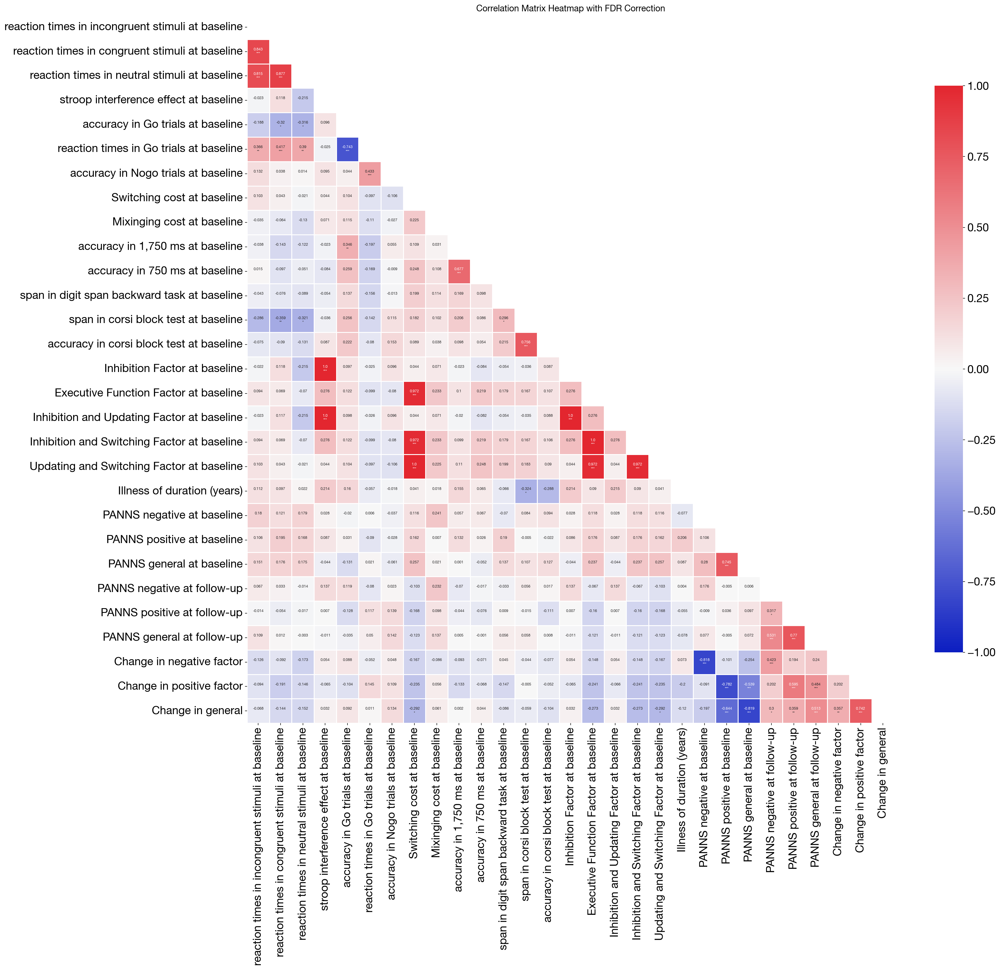

In [52]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests

pvalues_numeric = pvalues.apply(pd.to_numeric, errors='coerce')

all_pvalues = pvalues_numeric.values.flatten()
all_pvalues = all_pvalues[~np.isnan(all_pvalues)]  

rej, pval_corr, _, _ = multipletests(all_pvalues, alpha=0.05, method='fdr_bh')


pval_corr_matrix = pd.DataFrame(np.reshape(pval_corr, pvalues.shape), columns=pvalues.columns, index=pvalues.index)


labels_corr = corr.round(3).astype(str) + '\n' + pval_corr_matrix.apply(lambda x: x.map(significance_level))

fig, ax = plt.subplots(figsize=(24, 22))
sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels_corr, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 6})
ax.set_title('Correlation Matrix Heatmap with FDR Correction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关_FDR.jpg", dpi=100, bbox_inches='tight')
plt.show()

#### 与临床

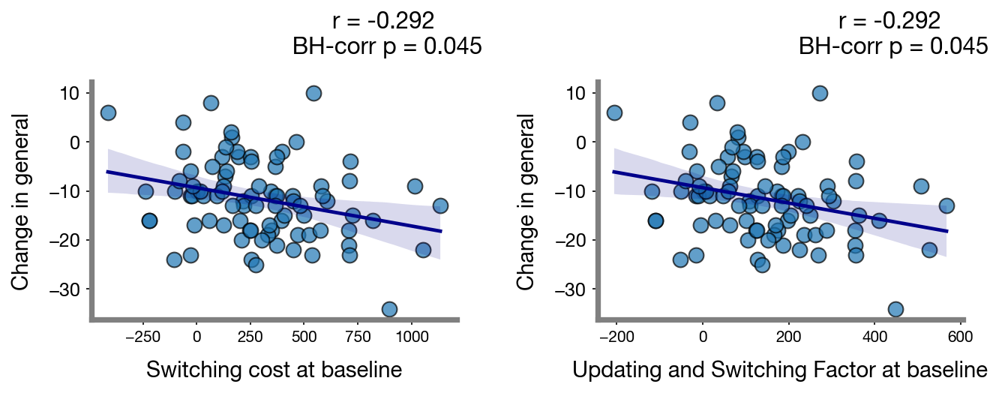

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

variables_of_interest =  [
    'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up',
'Change in negative factor',
'Change in positive factor',
'Change in general']


significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pval_corr_matrix.loc[(pval_corr_matrix[var] < 0.05) & (pval_corr_matrix.index != var), var].index.tolist())

significant_vars = list(set(significant_vars) - set(variables_of_interest))

num_plots = len(variables_of_interest) * len(significant_vars)
num_rows = 5  

fig, axes = plt.subplots(num_rows, 4, figsize=(18, num_rows * 3))  
axes = axes.flatten()
plot_idx = 0

for var2 in variables_of_interest:
    for var1 in significant_vars:
        paired_data = data[[var2, var1]].dropna()

        corrected_p = pval_corr_matrix.loc[var1, var2]
        if corrected_p < 0.05:
            ax = axes[plot_idx]
            plot_idx += 1
            sns.regplot(
                x=paired_data[var1], 
                y=paired_data[var2],
                scatter_kws={'alpha': 0.7, 's': 90, 'edgecolor': 'k'}, 
                line_kws={'color': 'darkblue'}, 
                ci=95,  
                ax=ax  
            )
            r, _ = pearsonr(paired_data[var1], paired_data[var2]) 
            p_value_str = "p < 0.001" if corrected_p < 0.001 else f"p = {corrected_p:.3f}"

            xpos = 0.80
            ypos = 1.2

            ax.text(xpos, ypos, f'r = {r:.3f}\n BH-corr {p_value_str}', fontsize=15, weight='bold', ha='center', va='center', transform=ax.transAxes)
            ax.set_ylabel(var2, fontsize=14, weight='bold', labelpad=10)
            ax.set_xlabel(f"{var1}", fontsize=14, weight='bold', labelpad=10)

            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=12)

            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color('grey')
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color('grey')
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

for i in range(plot_idx, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig("./results/散点图-预后执行功能=与临床的相关-血液相关_FDR-与临床.jpg", dpi=600, bbox_inches='tight')
plt.show()

### 补充2： 86人执行功能与PANSS相关分析（无FDR）

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy.stats import chi2_contingency


df = pd.read_excel('./results/after preprocessing-prognosis.xlsx')


continuous_columns = ['reaction times in incongruent stimuli at baseline',
'reaction times in congruent stimuli at baseline',
'reaction times in neutral stimuli at baseline',
'stroop interference effect at baseline',
'accuracy in Go trials at baseline',
'reaction times in Go trials at baseline',
'accuracy in Nogo trials at baseline',
'Switching cost at baseline',
'Mixinging cost at baseline',
'accuracy in 1,750 ms at baseline',
'accuracy in 750 ms at baseline',
'span in digit span backward task at baseline',
'span in corsi block test at baseline',
'accuracy in corsi block test at baseline',
'Inhibition Factor at baseline',
'Executive Function Factor at baseline',
'Inhibition and Updating Factor at baseline',
'Inhibition and Switching Factor at baseline',
'Updating and Switching Factor at baseline',
'Illness of duration (years)',
'PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up',
'Change in negative factor',
'Change in positive factor',
'Change in general']

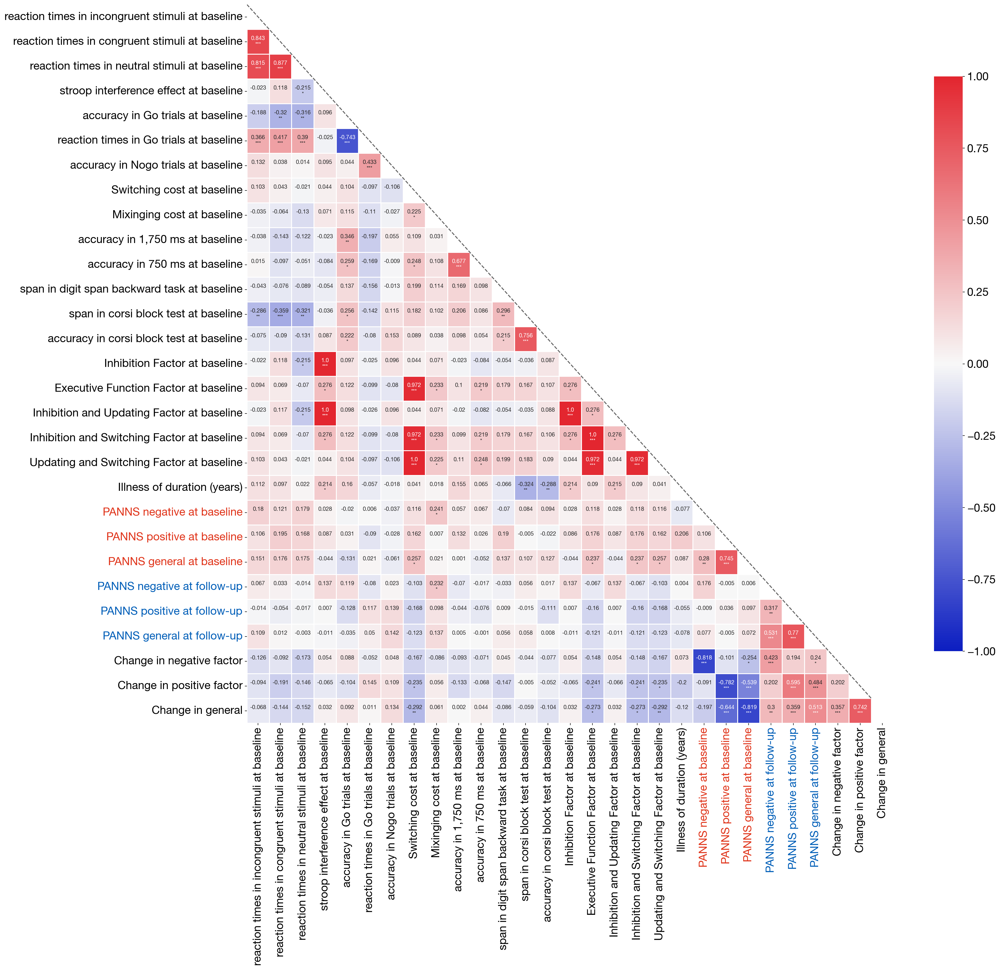

In [55]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import pearsonr

hex_colors_positive = ['#f7f7f7', '#E3262F']  
hex_colors_negative = ['#0C1EC1', '#f7f7f7']  

cmap_positive = LinearSegmentedColormap.from_list("Positive", hex_colors_positive, N=256)
cmap_negative = LinearSegmentedColormap.from_list("Negative", hex_colors_negative, N=256)


colors = np.vstack((cmap_negative(np.linspace(0, 1, 128)), cmap_positive(np.linspace(0, 1, 128))))
cmap_combined = LinearSegmentedColormap.from_list('Combined', colors)

data = df
corr = data[continuous_columns].corr()

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

pvalues = calculate_pvalues(data[continuous_columns])

def significance_level(pval):
    if pval < 0.001: return '***'
    elif pval < 0.01: return '**'
    elif pval < 0.05: return '*'
    else: return ''

labels = corr.round(3).astype(str) + '\n' + pvalues.applymap(significance_level)

mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(corr.values, 0)

fig, ax = plt.subplots(figsize=(24, 22))

sns.heatmap(corr, mask=mask, cmap=cmap_combined, center=0, annot=labels, fmt='', linewidths=.5, cbar_kws={"shrink": .8}, vmin=-1, vmax=1, annot_kws={"size": 9})


xticklabels = ax.get_xticklabels()
yticklabels = ax.get_yticklabels()

def color_labels(labels):
    for label in labels:
        text = label.get_text()

        if text in ['PANNS negative at baseline',
'PANNS positive at baseline',
'PANNS general at baseline',
'PANNS general at baseline',]:
            label.set_color('#E0341A') 
        elif text in ['PANNS negative at follow-up',
'PANNS positive at follow-up',
'PANNS general at follow-up']:
            label.set_color('#005EB8') 
        elif text in ['Change in negative factor (baseline minus follow-up)',
'Change in positive factor (baseline minus follow-up)',
'Change in general (baseline minus follow-up)']:
            label.set_color('#F67737')  
color_labels(xticklabels)
color_labels(yticklabels)

plt.plot(range(len(corr)), range(len(corr)), color='#606060', linestyle='dashed')

plt.tight_layout()
plt.savefig("./results/预后执行功能、血液与临床的相关.jpg", dpi=100, bbox_inches='tight')
plt.show()

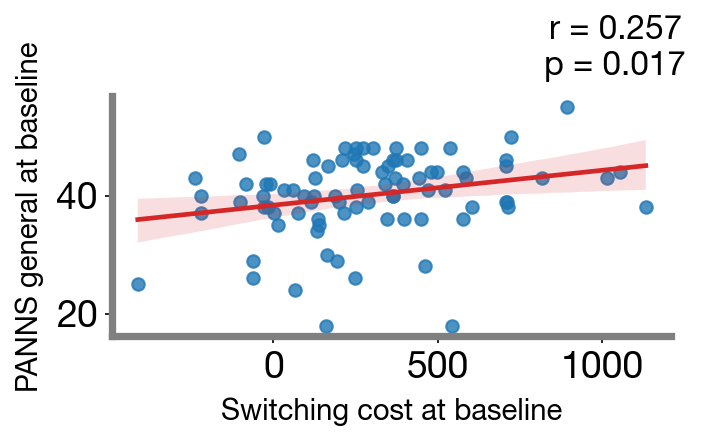

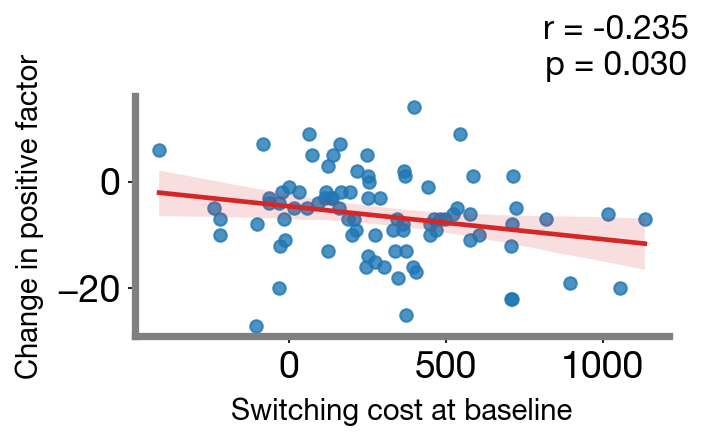

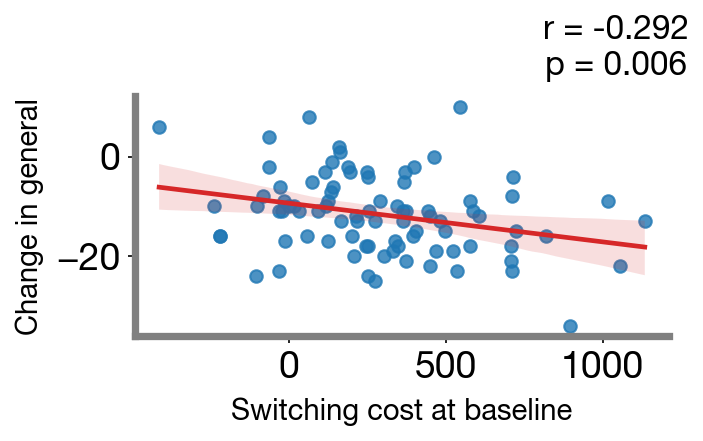

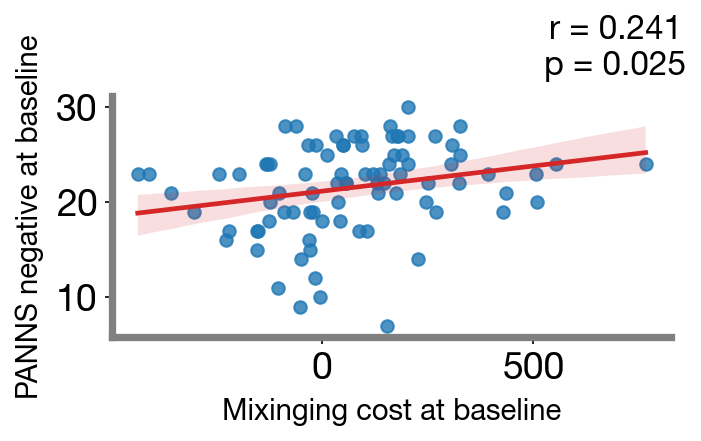

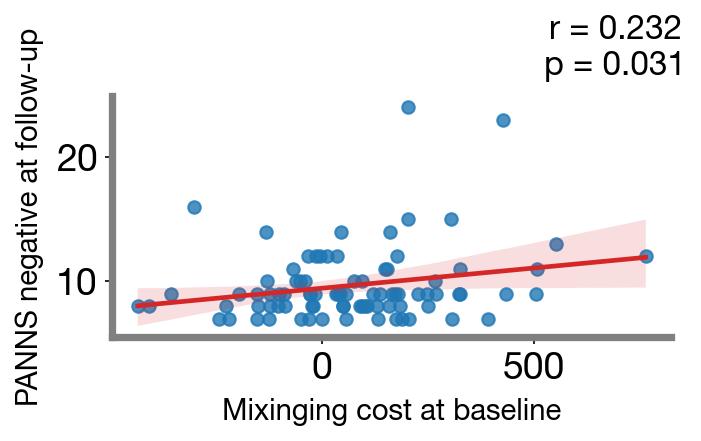

...

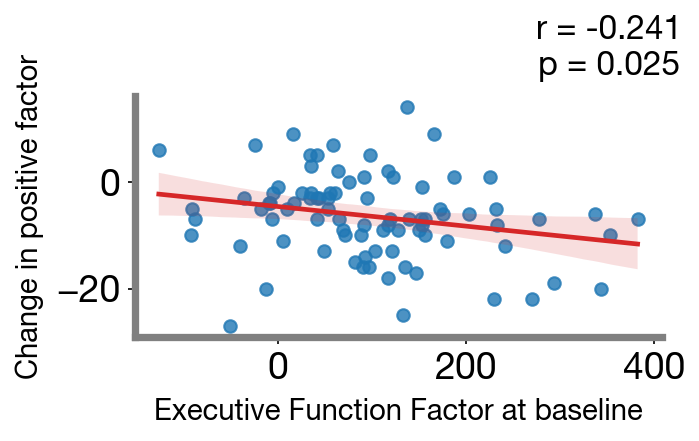

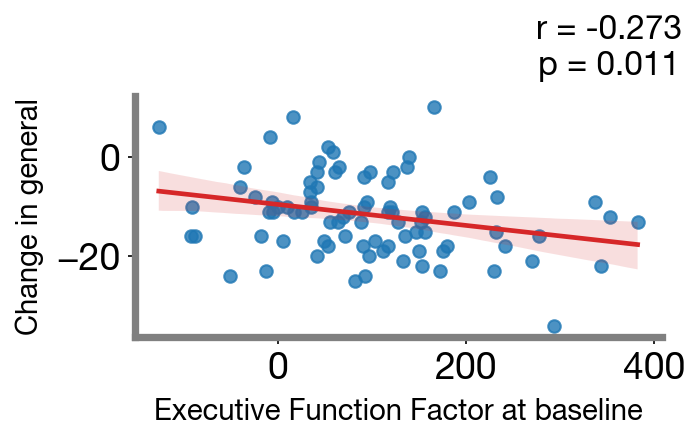

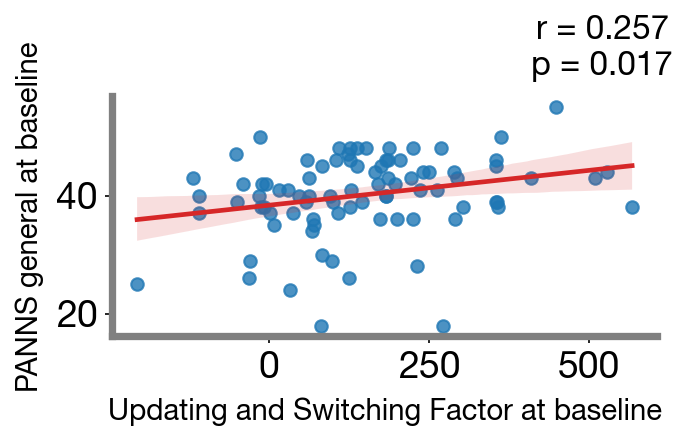

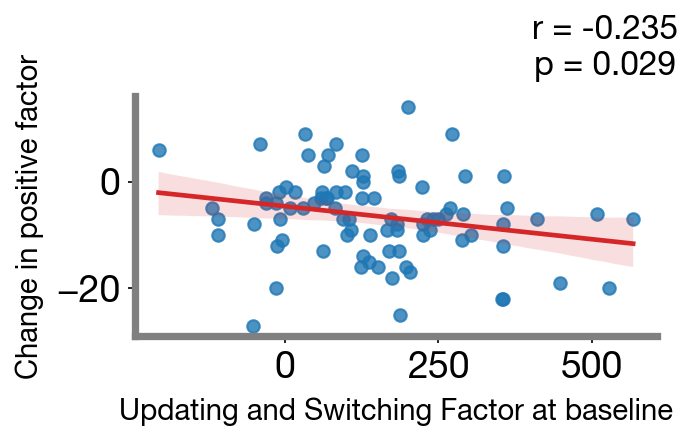

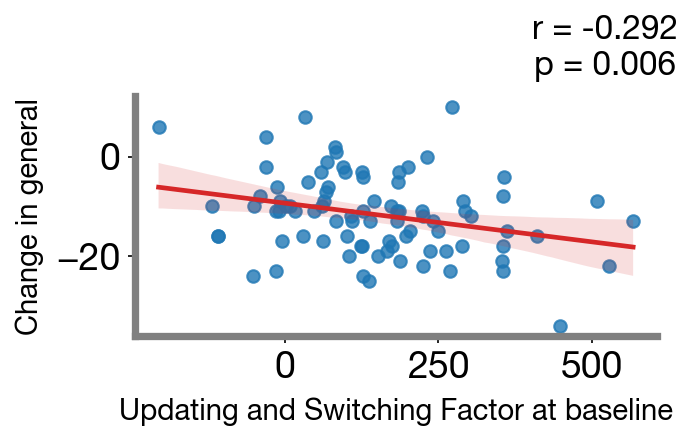

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr


variables_of_interest =  [
    'PANNS negative at baseline',
    'PANNS positive at baseline',
    'PANNS general at baseline',
    'PANNS negative at follow-up',
    'PANNS positive at follow-up',
    'PANNS general at follow-up',
    'Change in negative factor',
    'Change in positive factor',
    'Change in general'
]


significant_vars = []

for var in variables_of_interest:
    significant_vars.extend(pvalues.loc[(pvalues[var.replace('\n', ' ')] < 0.05) & (pvalues.index != var.replace('\n', ' ')), var.replace('\n', ' ')].index.tolist())

significant_vars = list(set(significant_vars) - set([var.replace('\n', ' ') for var in variables_of_interest]))

blue_hex = "#1f77b4"
red_hex = "#d62728"
grey_hex = "#808080"

for var1 in significant_vars:
    for var2 in variables_of_interest:
        if pvalues.loc[var1, var2.replace('\n', ' ')] < 0.05:
            plt.figure(figsize=(5, 3.5))

            sns.regplot(x=data[var1], y=data[var2.replace('\n', ' ')], line_kws={'color': red_hex}, scatter_kws={'color': blue_hex}, ci=95)

            r, p = pearsonr(data[var1], data[var2.replace('\n', ' ')])
            xpos = 0.9
            ypos = 1.2
            plt.text(xpos, ypos, f'r = {r:.3f}\np = {p:.3f}', fontsize=16, weight='bold', ha='center', va='center', transform=plt.gca().transAxes)

            plt.xlabel(var1, fontsize=14, weight='bold', labelpad=6)
            plt.ylabel(var2, fontsize=14, weight='bold', labelpad=6)


            ax = plt.gca()
            ax.spines['left'].set_linewidth(3.5)
            ax.spines['left'].set_color(grey_hex)
            ax.spines['bottom'].set_linewidth(3.5)
            ax.spines['bottom'].set_color(grey_hex)


            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)

            plt.tight_layout()
            plt.savefig(f"./results/{var1}_vs预后患者EF-PANSS无FDR_{var2.replace(' ', '_').replace('_', '_')}.jpg", dpi=600, bbox_inches='tight')
            plt.show()

## 全部完成

In [57]:
print("Sucess!")

Sucess!
